(dMRI-chapter)=

# Diffusion MRI

```{figure} ../../../static/neuroscience/fig_dissection_virtuelle.jpg
---
width: 800px
name: dissection-virtuelle-fig
---
On the left, a `post-mortem brain slice` prepared to highlight the `white matter fiber bundles`. On the right, a `virtual dissection` of `white matter bundles` generated using `diffusion MRI` data. Picture [shutterstock](https://www.shutterstock.com) ID `412065940`.
```

## Objectives

The purpose of this part of the course is to introduce you to the principles of [diffusion magnetic resonance imaging (dMRI)](https://en.wikipedia.org/wiki/Diffusion_MRI). `dMRI` is a `neuroimaging modality` that allows us to study **white matter fibres**. We are therefore able to examine the `connections` between different `regions`, both `interhemispheric` (i.e., `white matter fibers` traveling from one `hemisphere` to another), and `intrahemispheric` (i.e., `white matter fibers` traveling within the same `hemisphere`) . To get a concrete idea of ​​what `white matter fibers` look like, you can watch this [video](https://www.youtube.com/watch?v=PazaHElk6wc) presenting brain dissections, taken from the [course of Functional Neuroanatomy from UBC](http://www.neuroanatomy.ca/).

In [2]:
from IPython.display import HTML
import warnings
warnings.filterwarnings("ignore")

# Youtube
HTML('<iframe width="560" height="315" src="https://www.youtube.com/embed/PazaHElk6wc" title="YouTube video player" frameborder="0" allow="accelerometer; autoplay; clipboard-write; encrypted-media; gyroscope; picture-in-picture" allowfullscreen></iframe>')

During this lesson, we will cover:

   - The **physical** and **physiological** principles of the signal in `dMRI`.
   - The model of the **diffusion tensor**.
   - **tractography** analyses.

## Physical and physiological principles

### Water diffusion
```{figure} ../../../static/neuroscience/diffusion-water.jpg
---
width: 800px
name: diffusion-water-fig
---
Illustration of the `diffusion` of a drop of ink in a glass of `water`. Image by [Narudon Atsawalarpsakun](https://www.shutterstock.com/g/NARUDON+ATSAWALARPSAKUN) available at [shutterstock](https://www.shutterstock.com/image-photo/blue-food-coloring-diffuse -water-inside-736860766) ID `736860766`, used under standard shutterstock license.
```
In `diffusion MRI`, we are interested in the way `water` `diffuses` in the `brain`. By examining how `water` `diffuses`, we can learn information about the medium of `diffusion`, in our case, the `brain`! Specifically, `dMRI` allows us to learn more about the **microstructure properties** of `white matter fibers`. For a concrete example of `diffusion`, we can imagine what happens when we drop a drop of ink into a glass of `water`, illustrated as {numref}`diffusion-water-fig`. The ink will over time `diffuse` into the `water`, coloring the `water` little by little, until it becomes `homogeneously` colored. `Water` and ink `molecules` `collide` in `random directions`, and follow a `random walk process` called [Brownian motion](https://en.wikipedia.org/wiki/Brownian_motion), see {numref}` brownian-fig`.

In [1]:
"""Brownian motion
code adapted from Scipy Cookbook https://scipy-cookbook.readthedocs.io/items/BrownianMotion.html
under an MIT-like license https://github.com/scipy/scipy-cookbook/blob/master/LICENSE.txt
"""
def brownian(x0, n, dt, delta, out=None):
    """
    Generate an instance of Brownian motion (i.e. the Wiener process):

        X(t) = X(0) + N(0, delta**2 * t; 0, t)

    where N(a,b; t0, t1) is a normally distributed random variable with mean a and
    variance b.  The parameters t0 and t1 make explicit the statistical
    independence of N on different time intervals; that is, if [t0, t1) and
    [t2, t3) are disjoint intervals, then N(a, b; t0, t1) and N(a, b; t2, t3)
    are independent.

    Written as an iteration scheme,

        X(t + dt) = X(t) + N(0, delta**2 * dt; t, t+dt)


    If `x0` is an array (or array-like), each value in `x0` is treated as
    an initial condition, and the value returned is a numpy array with one
    more dimension than `x0`.

    Arguments
    ---------
    x0 : float or numpy array (or something that can be converted to a numpy array
         using numpy.asarray(x0)).
        The initial condition(s) (i.e. position(s)) of the Brownian motion.
    n : int
        The number of steps to take.
    dt : float
        The time step.
    delta : float
        delta determines the "speed" of the Brownian motion.  The random variable
        of the position at time t, X(t), has a normal distribution whose mean is
        the position at time t=0 and whose variance is delta**2*t.
    out : numpy array or None
        If `out` is not None, it specifies the array in which to put the
        result.  If `out` is None, a new numpy array is created and returned.

    Returns
    -------
    A numpy array of floats with shape `x0.shape + (n,)`.

    Note that the initial value `x0` is not included in the returned array.
    """


    x0 = np.asarray(x0)

    # For each element of x0, generate a sample of n numbers from a
    # normal distribution.
    if len(delta)>1:
        r = np.empty(x0.shape + (n,))
        r[0, :] = norm.rvs(size=(n,), scale=delta[0] * sqrt(dt))
        r[1, :] = norm.rvs(size=(n,), scale=delta[1] * sqrt(dt))
        r[2, :] = norm.rvs(size=(n,), scale=delta[2] * sqrt(dt))
    else:
        r = norm.rvs(size=x0.shape + (n,), scale=delta[0] * sqrt(dt))

    # If `out` was not given, create an output array.
    if out is None:
        out = np.empty(r.shape)

    # This computes the Brownian motion by forming the cumulative sum of
    # the random samples.
    np.cumsum(r, axis=-1, out=out)

    # Add the initial condition.
    out += np.expand_dims(x0, axis=-1)

    return out

import numpy as np
from matplotlib import pyplot as plt
from math import sqrt
from scipy.stats import norm

# The Wiener process parameter.
delta = [0.25]
# Total time.
T = 10.0
# Number of steps.
N = 500
# Time step size
dt = T/N
# Initial values of x.
x = np.empty((2,N+1))
x[:, 0] = 0.0

fig = plt.figure(figsize=(5, 5), dpi=100)
ax = plt.axes()
n_samp = 10
points = np.empty((2, n_samp))
for samp in range(n_samp):
    brownian(x[:,0], N, dt, delta, out=x[:,1:])

    # Plot the 2D trajectory.
    ax.plot(x[0, :], x[1, :])
    points[:, samp] = x[:, -1]

# Mark the start and end points.
ax.plot(x[0,0], x[1,0], 'ro', markersize=12, alpha=0.5)
for samp in range(n_samp):
    ax.plot(points[0, samp], points[1, samp],'bo', markersize=12, alpha=0.5)

# More plot decorations.
plt.title('Brownien 2D motion')
ax.set_xlabel('X axis')
ax.set_ylabel('Y axis')
ax.set_xlim([-2.5, 2.5])
ax.set_ylim([-2.5, 2.5])

# Glue the figure
from myst_nb import glue
glue("brownian-fig", fig, display=False)

plt.close()

```{glue:figure} brownian-fig
:figwidth: 500px
:name: "brownian-fig"
Illustration of `Brownian motion` of a `molecule`. The starting point is indicated by a red circle. The color `trajectories` correspond to simulated `random walks` following a `Brownian movement`. The `blue dots` indicate the `end point` of each `step`. Figure generated using Python code by P. Bellec, licensed under [CC-BY 4.0](https://creativecommons.org/licenses/by/4.0/). The `Brownian motion` simulation code is adapted from [Scipy Cookbook](https://scipy-cookbook.readthedocs.io/items/BrownianMotion.html) under a [license](https://github.com/scipy/scipy-cookbook/blob/master/LICENSE.txt) close to MIT.
```

### Isotropic and anisotropic diffusion

In [7]:
list_speed = (0.25, 0.5, 0.75)

# Initial values of x.
x = np.empty((3,N+1))
x[:, 0] = 0.0
fig = plt.figure(figsize=(13, 5), dpi=100)
for num, speed in enumerate(list_speed):
    fig.add_subplot(1, len(list_speed), num + 1, projection='3d')
    ax = plt.gca()
    n_samp = 1000
    delta=np.array([speed, 0.25, 0.25])
    bounds = [8, 8, 8]
    points = np.empty((3, n_samp))
    for samp in range(n_samp):
        brownian(x[:,0], N, dt, delta, out=x[:,1:])
        points[:, samp] = x[:, -1]
    ax.scatter(points[0, :], points[1, :], points[2, :], 'o', alpha=0.2)
    ax.set_box_aspect([ax.get_xlim()[1] - ax.get_xlim()[0],
                       ax.get_ylim()[1] - ax.get_ylim()[0],
                       ax.get_zlim()[1] - ax.get_zlim()[0]]
                    )
    ax.set_title(f'speed x = {speed}')
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_zlabel('z')

# Glue the figure
from myst_nb import glue
glue("anisotropic-fig", fig, display=False)  

plt.close()

```{glue:figure} anisotropic-fig
:figwidth: 800px
:name: "anisotropic-fig"
`Isotropic` vs `anisotropic diffusion`. Each blue circle represents the `arrival point` of a `water molecule` according to a `random walk` simulation with a `3D Brownian process`. On the graph on the left, the `diffusion rate` of `water molecules` is identical in all `directions`. On the graphs in the middle and on the right, the `diffusion velocity` is greater along the `x` axis than along the `y` and `z` axes. Figure generated using Python code by P. Bellec, licensed [CC-BY 4.0](https://creativecommons.org/licenses/by/4.0/).
```
The `movement` of `water molecules` in a `medium` follows a `Brownian motion`. If the `medium` has similar characteristics in all `directions`, it is said to be an **isotropic** `medium`. The left graph of the {numref}`anisotropic-fig` represents the set of `endpoints` of `random walks` in such an `isotropic medium`. We notice that the `molecules` are distributed approximately in a `sphere`. What if the `diffusion` is faster in a given `direction`, for example the `x` axis? We then speak of an **anisotropic** `medium`. On the middle graph, we see that the shape filled by the `molecules` is getting longer, and looks more like an American football than a `sphere` (or, in mathematical terms, an `ellipse`). The more the `diffusion velocity` difference on `x` grows with respect to the `y` and `z` `directions`, the more the shape lengthens (graph on the right).

### Diffusion and white matter fibers
```{figure} ../../../static/neuroscience/dissection.png
---
width: 800px
name: dissection-fig
---
`Cerebral dissection` illustrating the `organization` of `cerebral white matter` into `fiber bundles`. Bottom right: diagram illustrating the `diffusion` of `water` constrained by the `fibres`. The red dot corresponds to the origin of `random walks`, whose terminations are indicated by the blue dots. `Brain` images taken from {cite:p}`bakhit_superior_2020`, licensed under CC-BY 4.0. The rest of the figure by P Bellec, under license [CC-BY 4.0](https://creativecommons.org/licenses/by/4.0/), inspired by the thesis of C. Poupon, 1999.
```
The `axons` of the `neurons` come to constrain the `diffusion` of `water`, the `water` `molecules` can therefore not move freely in all `directions`. The `diffusion profile` of the `water` `molecules` then follows an `anisotropic shape`, as we have just seen in {numref}`anisotropic-fig`. `Water diffuses` more easily in the `direction` `parallel` to the `fibres`. `Diffusion` is therefore `anisotropic` and the `diffusion` `coefficient` will then be higher in this `parallel` `direction`, see {numref}`dissection-fig`.
So by knowing how `water` `diffuses`, we can determine the configuration of the `axons`. The phenomenon of `diffusion` depends on the `structure` of the `fabric`! This is the `physiological` principle at the origin of `dMRI` measurements.

### dMRI acquisition

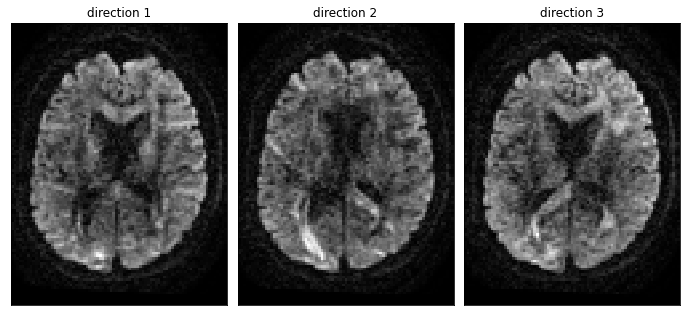

In [5]:
import numpy as np
from dipy.data import get_fnames
from dipy.io.image import load_nifti, save_nifti
import matplotlib.pyplot as plt

hardi_fname, hardi_bval_fname, hardi_bvec_fname = get_fnames('stanford_hardi')
data, affine = load_nifti(hardi_fname)

sli = data.shape[2] // 2
list_vol = [10, 40, 50]  # pick out random volumes and gradient directions

fig1, ax = plt.subplots(1, 3, figsize=(12, 6),
                        subplot_kw={'xticks': [], 'yticks': []})
fig1.subplots_adjust(hspace=0.3, wspace=0.05)

for num, vol in enumerate(list_vol):
    vol_slice = data[:, :, sli, vol]

    ax.flat[num].imshow(vol_slice.T, cmap='gray', interpolation='none',
                  origin='lower')
    ax.flat[num].set_title(f'direction {num+1}')
# Glue the figure
from myst_nb import glue
glue("diffusion-direction-fig", fig1, display=False)  

```{glue:figure} spread-direction-fig
:figwidth: 600px
:name: "broadcast-direction-fig"
`Diffusion-weighted` `MRI` `volumes`. Each `axial` `slice` represents a `diffusion-weighted` `T2* volume` for a different `direction`. Figure generated using Python code by P. Bellec, licensed [CC-BY 4.0](https://creativecommons.org/licenses/by/4.0/). The code is adapted from a [tutorial](https://dipy.org/documentation/1.4.1./examples_built/denoise_patch2self/#example-denoise-patch2self) of the [DIPY](https://dipy.org/) library, distributed under the [BSD 3-Clause](https://github.com/dipy/dipy/blob/master/LICENSE) license.
```
In `diffusion MRI`, we take `images` in several `orientations`. These are `T2*-weighted` `images` that we `acquire` using `dMRI` `data acquisition protocol`. The applied `sequence` makes the `image` sensitive to `water` `diffusion`, in a given `direction`. For a given `voxel`, we'll take measurements in different `directions`, which will tell us if the `water` has `diffused` a lot in that `direction`, much like the blue dots in the {numref}`dissection-fig`. For a `dMRI` `volume`, the value in a `voxel` tells us if the blue point is far or not from the red point, for a `direction` that we have selected, see {numref}`diffusion-direction-fig`

## Diffusion tensor

### The tensor model

```{figure} ../../../static/neuroscience/tensor-schematic.png
---
width: 600px
name: tensor-schematic-fig
---
The `diffusion` of `water` `molecules` over time can be visualized as a cloud of points. Due to the constraints of the environment, in particular the `axons`, this cloud takes the form of a rugby ball (top, left). The shape of the cloud can be approximated with a `tensor model` (bottom left). The main parameters of this model are the main `diffusion directions` $e_1$, $e_2$, $e_3$, as well as the `diffusion` values ​​associated with these `directions` $\lambda_1 \geq \lambda_2 \geq \lambda_3$. Figure by P. Bellec under license [CC-BY 4.0](https://creativecommons.org/licenses/by/4.0/), inspired by M. Descoteaux and C. Poupon.
```

From the simulations above, it is intuitive to imagine the `diffusion` of `water` as a balloon, more or less elongated. Mathematically, this is formulated with a `diffusion tensor`, or **Gaussian model**, see {numref}`tensor-schematic-fig`. To estimate the shape of our balloon in each `voxel`, we use the different `scattering` values ​​obtained for each `acquisition direction`. If the spread is greater in a certain `direction`, our ball will look more like a rugby ball. If the `diffusion` is similar in all `acquisition directions`, we will obtain a soccer ball instead.

### Diffusion Tensor Imaging

In [9]:
# Import modules
import numpy as np
from dipy.io.image import load_nifti, save_nifti
from dipy.io.gradients import read_bvals_bvecs
from dipy.core.gradients import gradient_table
import dipy.reconst.dti as dti
from dipy.data import get_fnames

# Select patch
minx = 1
maxx = 81
miny = 1
maxy = 106
minz = 28
maxz = 32

# Download HARDI data
hardi_fname, hardi_bval_fname, hardi_bvec_fname = get_fnames('stanford_hardi')
data, affine = load_nifti(hardi_fname)
bvals, bvecs = read_bvals_bvecs(hardi_bval_fname, hardi_bvec_fname)
gtab = gradient_table(bvals, bvecs)

# Force affine to something simple to make it easier to extract patches
affine = np.eye(4)

# Mask data and estimate tensors
from dipy.segment.mask import median_otsu
data = data[:, :, minz:maxz, :]
maskdata, mask = median_otsu(data, vol_idx=range(10, 50), median_radius=3,
                             numpass=1, autocrop=True, dilate=2)
tenmodel = dti.TensorModel(gtab)
tenfit = tenmodel.fit(maskdata)

# Generate derived metrics (FA etc)
from dipy.reconst.dti import fractional_anisotropy, color_fa
FA = fractional_anisotropy(tenfit.evals)
FA[np.isnan(FA)] = 0
FA = np.clip(FA, 0, 1)
RGB = color_fa(FA, tenfit.evecs)
MD1 = dti.mean_diffusivity(tenfit.evals)

# Figure
from dipy.data import get_sphere
sphere = get_sphere('repulsion724')
from dipy.viz import window, actor
scene = window.Scene()
evals = tenfit.evals[minx:maxx, miny:maxy, :]
evecs = tenfit.evecs[minx:maxx, miny:maxy, :]

# boost the colors
RGB *= 2
RGB[RGB>1] = 1
cfa = RGB[minx:maxx, miny:maxy, :]
scene.add(actor.tensor_slicer(evals, evecs, scalar_colors=cfa, sphere=sphere,
                              scale=0.3))
scene.set_camera(position=(14.87946710578175, 25.770232149765413, 173.54578028650144),
                 focal_point=(33.43851200470716, 40.67356830562871, 15.545914873824975),
                 view_up=(0.003256400517440014, 0.9955397521536979, 0.09428678453221151))
window.record(scene, n_frames=1, out_path='tensor-slice.png',
              size=(1000, 1000), reset_camera=False)
scene.set_camera(position=(6.398539759431944, 36.122368120824724, 21.074961978614017),
                 focal_point=(17.02336666201742, 55.39317316617157, 7.230217513090364),
                 view_up=(0.10205867972271891, 0.5426923506538308, 0.8337080055001721))
window.record(scene, n_frames=1, out_path='tensor-zoom.png',
              size=(600, 600), reset_camera=False)             

# Make figure
from matplotlib import pyplot as plt
import imageio
fig1, ax = plt.subplots(1, 2, figsize=(12, 6), dpi=200,
                        subplot_kw={'xticks': [], 'yticks': []})
fig1.subplots_adjust(hspace=0.3, wspace=0.05)
im = imageio.imread('tensor-slice.png')
ax.flat[0].imshow(im, interpolation='antialiased')
ax.flat[0].set_title('full slice')
im = imageio.imread('tensor-zoom.png')
ax.flat[1].imshow(im, interpolation='none')
ax.flat[1].set_title('zoom')

# Glue the figure
from myst_nb import glue
glue("tensor-fig", fig1, display=False)

plt.close()

```{glue:figure} tensor-fig
:figwidth: 800px
:name: "tensor-fig"
`Diffusion tensors` estimated on an `axial slice` (left) and zoom on a portion of the slice (right). The color of each `tensor` codes for the main `direction` of `diffusion`, as well as the `fractional anisotropy` of each `tensor`. The brightest `tensors` are strongly `anisotropic`, ie the `principal` `direction` of `diffusion` is clearly stronger than the `transverse` `directions`. Figure generated by python code adapted from a [DIPY tutorial](https://dipy.org/documentation/1.4.1./examples_built/reconst_dti/#example-reconst-dti) by P. Bellec under license [CC- BY 4.0](https://creativecommons.org/licenses/by/4.0/).
```

`Diffusion tensor imaging` (*diffusion tensor imaging*, `DTI`) is one of the first analysis techniques that emerged in `diffusion MRI`. To estimate the shape of our balloon, we need at least six `acquisition directions`: `xy`, `xz`, `yz`, `-xy`, `-xz`, `y-z`. It is by combining the `images` in these six `directions` that we can estimate our `diffusion tensor` (our balloon). Since we have these measurements for each of the `voxels`, we can create a `brain` `volume` where the value of each `voxel` is a `tensor` (balloon), see {numref}`tensor-fig`.

### Characteristics of tensors

In [10]:
import matplotlib.pyplot as plt
RGB2 = np.empty([RGB.shape[1], RGB.shape[0], RGB.shape[3]])
MD = MD1
MD[mask==0] = 0

for num in range(3):
    RGB2[:, :, num] = np.squeeze(RGB[:, :, 0, num]).T

fig1, ax = plt.subplots(1, 3, figsize=(12, 6),
                        subplot_kw={'xticks': [], 'yticks': []})

fig1.subplots_adjust(hspace=0.3, wspace=0.05)
ax.flat[0].imshow(np.squeeze(FA[:, :, 0]).T, origin='lower',
                  cmap='gray', vmin=0, vmax=1)
ax.flat[0].set_title('FA map')
ax.flat[1].imshow(np.squeeze(MD[:, :, 0]).T, origin='lower',
                  cmap='gray')
ax.flat[1].set_title('DM map')
ax.flat[2].imshow(RGB2, origin='lower')
ax.flat[2].set_title('principal direction')

# Glue the figure
from myst_nb import glue
glue("fa-md-rgb-fig", fig1, display=False)

plt.close()

```{glue:figure} fa-md-rgb-fig
:figwidth: 800px
:name: "fa-md-rgb-fig"
 `Tensor-derived maps` in `diffusion MRI`: `fractional anisotropy` (left), `mean diffusivity` (middle) and `principal direction` of the `tensor` (right). For the `main direction`, the `medial-lateral` (`x`) `axis` is coded in red, the `anterior-posterior` (`y`) `axis` is coded in green, and the `ventral-dorsal` (`z`) `axis` is coded in blue. Figure generated using Python code adapted from a [DIPY tutorial](https://dipy.org/documentation/1.4.1./examples_built/reconst_fwdti/#example-reconst-fwdti) by P. Bellec, under license [CC-BY 4.0](https://creativecommons.org/licenses/by/4.0/).
```
It is possible to summarize some important characteristics of `diffusion tensors` using a single measure, such as `fractional anisotropy` and `mean diffusivity` (see definitions below). We therefore extract a measurement per `voxel`, which can be represented with a `cerebral map`, in a similar way to what we have seen with `T1` or `T2 weighted` `images`, see {numref}`fa-md-rgb- fig`. It is also possible to create a color image, which codes for the `main direction` of `diffusion`.

```{admonition} Fractional Anisotropy
A popular measure is [Fractional Anisotropy](https://en.wikipedia.org/wiki/Fractional_anisotropy) (FA), which measures the `degree` of `anisotropy` of a `diffusion` phenomenon, by taking values ​​between `0` and `1`. A `fractional anisotropy` value of `0` indicates `isotropic diffusion` (soccer ball), while a value of `1` indicates strongly `anisotropic diffusion` (rugby ball). Note that the `fractional anisotropy` of `water` is `0`, unless `diffusion` is constrained by a structure. Strong `FA` values ​​are usually found in `white matter`.
```
```{admonition} Average Diffusivity
We can also measure the **mean diffusivity** according to the following equation (see {numref}`tensor-schematic-fig` for notations):
$\overline{\lambda} = \frac{\lambda_{1}+\lambda_{2}+\lambda_{3}}{3}$
The `average diffusivity` tells us how much `diffusion` there is inside a `voxel`. The `average diffusivity` is very strong in the `cerebrospinal fluid`, where the `water` `molecules` are very little constrained.
```

```{admonition} Main Direction of Dissemination
In order to visualize which `main direction` the `tensors` point, a popular approach is to encode each `x`, `y`, and `z` `axis` with a color (red, green, blue, respectively). For a given `direction`, the three colors are mixed in a proportion corresponding to the contributions of the three `axes`.
```

## Tractography

### Streamline Tractography

In [11]:
from matplotlib import pyplot as plt
MD = MD1
MD[mask==0] = 0
threshold_fa = 0.3
mask_wm = FA > threshold_fa


fig1, ax = plt.subplots(1, 2, figsize=(12, 6),
                        subplot_kw={'xticks': [], 'yticks': []})

fig1.subplots_adjust(hspace=0.3, wspace=0.05)
ax.flat[0].imshow(np.squeeze(FA[:, :, 0]).T, origin='lower',
                  cmap='gray', vmin=0, vmax=1)
ax.flat[0].set_title('fractional anisotropy map')
ax.flat[1].imshow(np.squeeze(mask_wm[:, :, 0]).T, origin='lower',
                  cmap='gray')
ax.flat[1].set_title('white matter mask')

# Glue the figure
from myst_nb import glue
glue("mask-wm-fig", fig1, display=False)

plt.close()

In [12]:
from dipy.tracking import utils

seeds = utils.seeds_from_mask(mask_wm[minx:maxx, miny:maxy, :], affine, density=[1, 1, 1])

from dipy.tracking.stopping_criterion import ThresholdStoppingCriterion

stopping_criterion = ThresholdStoppingCriterion(FA, 0.1)

from dipy.direction import peaks_from_model
csa_peaks = peaks_from_model(tenmodel, maskdata[minx:maxx, miny:maxy, :, :], sphere,
                             relative_peak_threshold=.8,
                             min_separation_angle=45,
                             mask=mask_wm[minx:maxx, miny:maxy, :])

from dipy.tracking.local_tracking import LocalTracking
from dipy.tracking.streamline import Streamlines

# Initialization of LocalTracking. The computation happens in the next step.
streamlines_generator = LocalTracking(csa_peaks, stopping_criterion, seeds,
                                      affine=affine, step_size=0.2, max_cross=2)
# Generate streamlines object
streamlines = Streamlines(streamlines_generator)

from dipy.viz import colormap
color = colormap.line_colors(streamlines)
streamlines_actor = actor.line(streamlines,
                               colormap.line_colors(streamlines))

# Create the 3D display.
scene = window.Scene()
scene.add(streamlines_actor)
scene.add(actor.tensor_slicer(evals, evecs, scalar_colors=cfa, sphere=sphere,
                              scale=0.3))
scene.set_camera(position=(14.87946710578175, 25.770232149765413, 173.54578028650144),
                 focal_point=(33.43851200470716, 40.67356830562871, 15.545914873824975),
                 view_up=(0.003256400517440014, 0.9955397521536979, 0.09428678453221151))
window.record(scene, n_frames=1, out_path='../../../static/neuroscience/fibers-slice.png',
              size=(1000, 1000), reset_camera=False)
scene.set_camera(position=(6.398539759431944, 36.122368120824724, 21.074961978614017),
                 focal_point=(17.02336666201742, 55.39317316617157, 7.230217513090364),
                 view_up=(0.10205867972271891, 0.5426923506538308, 0.8337080055001721))
window.record(scene, n_frames=1, out_path='../../../static/neuroscience/fibers-zoom.png',
              size=(1000, 1000), reset_camera=False)

# Make figure
from matplotlib import pyplot as plt
import imageio
fig1, ax = plt.subplots(1, 2, figsize=(12, 6), dpi=300,
                        subplot_kw={'xticks': [], 'yticks': []})
fig1.subplots_adjust(hspace=0.3, wspace=0.05)
im = imageio.imread('../../../static/neuroscience/fibers-slice.png')
ax.flat[0].imshow(im, interpolation='antialiased')
ax.flat[0].set_title('full slice')
im = imageio.imread('../../../static/neuroscience/fibers-zoom.png')
ax.flat[1].imshow(im, interpolation='antialiased')
ax.flat[1].set_title('zoom')

# Glue the figure
from myst_nb import glue
glue("fibers-fig", fig1, display=False)

plt.close()

```{glue:figure} fibers-fig
:figwidth: 800px
:name: "fibers-fig"
`Fibers` reconstructed by a `deterministic streamline approach`, which consists in `drawing` a `fiber` following the `principal direction` of each `tensor` in an `iterative` way, starting from all the points in the `white matter` on an `axial section` (left) and zooming in on a portion of the cut (right). The color of each `fiber` codes for the `main direction` of `diffusion` along the `fiber`. Figure generated by python code adapted from a [DIPY tutorial](https://dipy.org/documentation/1.4.1./examples_built/tracking_introduction_eudx/#example-tracking-introduction-eudx) by P. Bellec under license [ CC-BY 4.0](https://creativecommons.org/licenses/by/4.0/).
```

[Tractography](https://en.wikipedia.org/wiki/Tractography) makes it possible to `trace` the `path` of `white matter fibers` in vivo. There are several approaches to `tractography`. `Deterministic` *streamline* `tractography` makes it possible to `reconstruct` `white matter fibers` starting from a given point in the `white matter` and moving `iteratively` along the `main direction` of `diffusion`. The path will end when we come to `gray matter`. This `path` will be `traced` using specific algorithms. `Probabilistic tractography` is similar to `deterministic tractography`, but also considers uncertainty about the `direction` of `white matter fibers`. So instead of `reconstructing` a **single** `fiber` associated with a point of `white matter`, `probabilistic tractography` will `reconstruct` **several** that will all be slightly different.

```{admonition} Preprocessing steps
Just like `fMRI`, `registration` and `denoising` steps are necessary to prepare the `data` before `estimating` the `tensors` and performing the `tractography`. Many parameters have to be selected for the `tractography` itself, which can influence the results. It is also necessary to select a `white matter mask` that contains the starting points for `fiber reconstruction`, obtained here by `thresholding` an `AF map`.
```{glue:figure} mask-wm-fig
:figwidth: 500px
:name: "mask-wm-fig"
`Fractional anisotropic map` (left) and `white matter mask` obtained by `thresholding` (right). Figure generated by python code adapted from a [DIPY tutorial](https://dipy.org/documentation/1.4.1./examples_built/tracking_introduction_eudx/#example-tracking-introduction-eudx) by P. Bellec under license [ CC-BY 4.0](https://creativecommons.org/licenses/by/4.0/).
```

### Fiber crossing
```{figure} ../../../static/neuroscience/crossing-fibers.png
---
width: 800px
name: crossing-fibers
---
Illustration of the `fiber crossing problem`, shown at left. The `diffusion` of `water` in each `fiber` is associated with a `tensor` that points in a different `direction` (middle). When we try to `approximate` the `diffusion` in the `crossing` with a **single** `tensor`, we observe an `isotropic tensor` (right). Figure by P Bellec, under license [CC-BY 4.0](https://creativecommons.org/licenses/by/4.0/), inspired by the thesis of C. Poupon, 1999.
```
A limitation we encounter with `diffusion tensor imaging` is `fiber crossing`. It is very common in `white matter` to have several `intersecting` `fiber bundles`. When many `fibers` `cross` as in the figure below, the `diffusion tensor` appears `isotropic`, even if there are indeed `fibers` present in the `voxel`. In this case, the `fiber reconstruction` algorithm will not know which `direction` to follow. One of the techniques used to solve this problem is **high resolution diffusion imaging**, which allows us to estimate several `tensors` for the same `voxel`. This technique consists of `acquiring` `data` in many `directions` (around `30` to `60` `directions`) using a **HARDI** `sequence` (*High Angular Resolution Diffusion Imaging*). The `acquisitions` made with this `sequence` are longer than those in `DTI`, `5-30` min vs `3-4` min.

In [15]:
from matplotlib import pyplot as plt
from dipy.reconst.csdeconv import auto_response_ssst
from dipy.reconst.csdeconv import ConstrainedSphericalDeconvModel
from dipy.data import default_sphere
from dipy.viz import actor

response, ratio = auto_response_ssst(gtab, maskdata, roi_radii=10, fa_thr=0.7)
csd_model = ConstrainedSphericalDeconvModel(gtab, response)
csd_fit = csd_model.fit(maskdata)
csd_odf = csd_fit.odf(default_sphere)
from dipy.data import default_sphere
fodf_spheres = actor.odf_slicer(csd_odf, sphere=default_sphere, scale=0.9,
                                norm=False, colormap='plasma')

# Create the 3D display.
scene = window.Scene()
scene.add(fodf_spheres)
scene.set_camera(position=(14.87946710578175, 25.770232149765413, 173.54578028650144),
                 focal_point=(33.43851200470716, 40.67356830562871, 15.545914873824975),
                 view_up=(0.003256400517440014, 0.9955397521536979, 0.09428678453221151))
window.record(scene, n_frames=1, out_path='../../../static/neuroscience/fodf-slice.png',
              size=(1000, 1000), reset_camera=False)
scene.set_camera(position=(6.398539759431944, 36.122368120824724, 21.074961978614017),
                 focal_point=(17.02336666201742, 55.39317316617157, 7.230217513090364),
                 view_up=(0.10205867972271891, 0.5426923506538308, 0.8337080055001721))
window.record(scene, n_frames=1, out_path='../../../static/neuroscience/fodf-zoom.png',
              size=(600, 600), reset_camera=False)   

# Make figure
from matplotlib import pyplot as plt
import imageio
fig1, ax = plt.subplots(1, 2, figsize=(12, 6), dpi=200,
                        subplot_kw={'xticks': [], 'yticks': []})
fig1.subplots_adjust(hspace=0.3, wspace=0.05)
im = imageio.imread('../../../static/neuroscience/fodf-slice.png')
ax.flat[0].imshow(im, interpolation='antialiased')
ax.flat[0].set_title('full slice')
im = imageio.imread('../../../static/neuroscience/fodf-zoom.png')
ax.flat[1].imshow(im, interpolation='none')
ax.flat[1].set_title('zoom')

# Glue the figure
from myst_nb import glue
glue("fodf-fig", fig1, display=False)

plt.close()

100%|███████████████████████████████████████████████████████████████████████████████████████| 24424/24424 [00:07<00:00, 3338.83it/s]


```{glue:figure} fodf-fig
:figwidth: 800px
:name: "fodf-fig"
`Estimation` of `fODF` on an `axial slice` (left) and zoom on a portion of the `slice` (right). Figure generated by python code adapted from a [DIPY tutorial](https://dipy.org/documentation/1.4.1./examples_built/reconst_csd/#example-reconst-csd) by P. Bellec under license [CC- BY 4.0](https://creativecommons.org/licenses/by/4.0/).
```
With a `HARDI` `sequence`, we can `estimate` a `fiber` `Orientation Distribution Function` (`fODF`) when there are `perpendicular` `fiber` `crossings`. This allows us to `estimate` **several** `tensors` inside a `voxel` and to overcome certain limits of the `diffusion tensor` (`DTI`). In areas with low `anisotropy` we observe **several** `directions`, like small balloons in each `voxel`, while we observe a `main direction` in the most important `fibers`.

In [16]:
csa_peaks = peaks_from_model(csd_model, maskdata[minx:maxx, miny:maxy, :, :], default_sphere,
                             relative_peak_threshold=.5,
                             min_separation_angle=15,
                             mask=mask_wm[minx:maxx, miny:maxy, :])

# Initialization of LocalTracking. The computation happens in the next step.
streamlines_generator = LocalTracking(csa_peaks, stopping_criterion, seeds,
                                      affine=affine, step_size=0.2, max_cross=5)
# Generate streamlines object
streamlines = Streamlines(streamlines_generator)

from dipy.viz import colormap
color = colormap.line_colors(streamlines)
streamlines_actor = actor.line(streamlines,
                               colormap.line_colors(streamlines))

# Create the 3D display.
scene = window.Scene()
scene.add(streamlines_actor)
scene.add(fodf_spheres)
scene.set_camera(position=(14.87946710578175, 25.770232149765413, 173.54578028650144),
                 focal_point=(33.43851200470716, 40.67356830562871, 15.545914873824975),
                 view_up=(0.003256400517440014, 0.9955397521536979, 0.09428678453221151))
window.record(scene, n_frames=1, out_path='../../../static/neuroscience/fibers-slice.png',
              size=(1000, 1000), reset_camera=False)
scene.set_camera(position=(6.398539759431944, 36.122368120824724, 21.074961978614017),
                 focal_point=(17.02336666201742, 55.39317316617157, 7.230217513090364),
                 view_up=(0.10205867972271891, 0.5426923506538308, 0.8337080055001721))
window.record(scene, n_frames=1, out_path='../../../static/neuroscience/fibers-zoom.png',
              size=(1000, 1000), reset_camera=False)

# Make figure
from matplotlib import pyplot as plt
import imageio
fig1, ax = plt.subplots(1, 2, figsize=(12, 6), dpi=300,
                        subplot_kw={'xticks': [], 'yticks': []})
fig1.subplots_adjust(hspace=0.3, wspace=0.05)
im = imageio.imread('../../../static/neuroscience/fibers-slice.png')
ax.flat[0].imshow(im, interpolation='antialiased')
ax.flat[0].set_title('full slice')
im = imageio.imread('../../../static/neuroscience/fibers-zoom.png')
ax.flat[1].imshow(im, interpolation='antialiased')
ax.flat[1].set_title('zoom')

# Glue the figure
from myst_nb import glue
glue("fodf-tracts-fig", fig1, display=False)

plt.close()

```{glue:figure} fodf-tracts-fig
:figwidth: 800px
:name: "fodf-tracts-fig"
`Fibers` `reconstructed` by a `deterministic streamline approach` with a `multi-tensor` approach, which makes it possible to follow **several** `diffusion peaks` at each `voxel`, from all the points in the `white matter` on an `axial slice` (left) and zoom on a portion of the cut (right). This approach makes it possible to be more robust to the presence of `crossing fibers`. Figure generated by python code adapted from a [DIPY tutorial](https://dipy.org/documentation/1.4.1./examples_built/tracking_introduction_eudx/#example-tracking-introduction-eudx) by P. Bellec under license [ CC-BY 4.0](https://creativecommons.org/licenses/by/4.0/).
```
The ability of `fODF` to represent `multiple tensors` at each `voxel` allows the `reconstruction` of `intersecting fibers`, as is apparent in the zoom of {numref}`fodf-tracts-fig`. It is important to realize that the `data` used to generate {numref}`fibers-fig` and {numref}`fodf-tracts-fig` are the same, but the `reconstructed` `fibers` are very different! The parameters that we choose for the `reconstruction` method will also change the shape and the number of `fibers`. `dMRI tractography` is therefore not an exact science, and false positives (a `reconstructed` `fiber` that does not really exist) as well as false negatives (a `fiber` that is not `reconstructed` but which nevertheless exists) are very common.

### Fiber Bundles

```{figure} ../../../static/neuroscience/faisceaux.png
---
width: 800px
name: bundles-fig
---
 Illustration of three `fiber bundles`: the `radiating optics` (`OR`), the `arcuate fasciculus bundle` (`AF`) and the `vertical occipital bundle` (`VOF`). The `bundles` are presented on `different views` of a `dissection` (`A`, `B`, `D`), as well as using a `virtual dissection` (`C`). Figure taken from {cite:p}`jitsuishi_white_2020`, licensed under CC-BY 4.0.
```
We can provide `tractography` algorithms with `priors` about the `fibers` in the `brain` that we know from `dissection` studies. In a **systematic reconstruction** of `fibers`, everything will be `traced`, whereas in a **virtual dissection**, only certain `bundles` of `fibers` will be selected. These `priors` make it possible to limit false positives, and the use of `high-performance tractography` algorithms makes it possible to limit false negatives. There are a number of classic `fiber bundles` with well-established `dissection` patterns, such as the `corpus callosum`, the `arcuate fasciculus bundle`, or the `superior longitudinal fascicle`.

It is possible to calculate the average value of the `fractional anisotropy`, or any other metric, along a `fiber`, and then to compare this average value between different `individuals` to perform `statistical tests`. In this case, the `registration` between `individuals` is done via the identification of `fiber bundles`, rather than by a `non-linear deformation` method.

## Conclusion

In this part of the course, we have seen the principles of `diffusion MRI`. Specifically, we have seen:
- How to obtain `dMRI` `images` thanks to the `diffusion` of `water` in different `directions`.
- How to `estimate` the `diffusion` process using `tensors` and measure different metrics (`average diffusivity`, `fractional anisotropy`).
- The principle of `tractography` methods.
- How to `estimate` `fiber crossings`.
- How `dMRI` can be used to perform `virtual dissection`.

## References
```{bibliography}
:filter: docname in docnames
```
## Exercices

In the following we created a few exercises that aim to recap core aspects of this part of the course and thus should allow you to assess if you understood the main points.

```{admonition} Exercise 6.1
:class: dropdown
`Diffusion MRI` can measure... (true/false, explain your answers)
 1. An `image` with a `tensor` at each `voxel`.
 2. An `image` with one or more `tensors` at each `voxel`.
 3. A `series` of `images` sensitive to the `diffusion` of `water` in different `directions`.
 4. `Images` showing the `white matter fibers` of the `brain` in `3D`.
```

```{admonition} Exercise 6.2
:class: dropdown
Give an example of a `region` with...
 1. Low `fractional anisotropy`, with high average `diffusivity`?
 2. Strong `fractional anisotropy`, with low average `diffusivity`?
 3. Low `fractional anisotropy`, with low average `diffusivity`?
```

```{admonition} Exercise 6.3
:class: dropdown
We observe a `voxel` whose `fractional anisotropy` is low. Give two interpretations of this observation.
```

```{admonition} Exercise 6.4
:class: dropdown
List three examples of `fiber bundles`.
```

```{admonition} Exercise 6.5
:class: dropdown
Give two examples of problems that can cause a `deterministic streamline tractography` process to fail.
```

```{admonition} Exercise 6.6
:class: dropdown
What is the advantage of performing `group statistics` on a `fiber bundle`, rather than `voxel` by `voxel` with traditional `anatomical` `registration`, as in `fMRI`?
```

```{admonition} Exercise 6.7
:class: dropdown
To answer the questions in this exercise, first read the article *Quantification of apparent `axon` `density` and `orientation` `dispersion` in the `white matter` of youth born with congenital heart disease* by Easson et al. (published in 2020 in the journal *Neuroimage* , volume 205, ID 116255).
It is freely available at this [address](https://doi.org/10.1016/j.neuroimage.2019.116255).
The following questions require short-answer answers.
 - What type of `participants` were recruited in this study?
 - What is the main objective of the study?
 - What are the inclusion and exclusion criteria?
 - What `neuroimaging` technique is used? Is it a `structural` or `functional` technique?
 - What type of `image acquisition sequence` is used? List the parameters.
 - What types of analyzes have been applied?
 - Which figure (or table) meets the main objective of the study?
 - What is the main result of the study?
```